# Importing The Modules

In [1]:
#Basic Libraries
import pandas as pd 
import numpy as np 

#NLTK Libraries
import nltk 
import re
import emoji
import string
from string import digits
from nltk.corpus import stopwords
from textblob import TextBlob
import spacy
from sklearn.feature_extraction.text import TfidfVectorizer

# Scikit-Learn libraries
import sklearn 
from sklearn import preprocessing
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import label_binarize
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn import svm, datasets

#Metrics libraries
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix, accuracy_score

#Visualization libraries
import matplotlib.pyplot as plt 
import seaborn as sns
from textblob import TextBlob
from plotly import tools
import plotly.express as px
from plotly.offline import iplot
%matplotlib inline

#Ignore warnings
import warnings
warnings.filterwarnings('ignore')

#Other miscellaneous libraries
import statsmodels
from scipy import interp
from itertools import cycle
from statistics import stdev
import cufflinks as cf
from collections import defaultdict
from collections import Counter
from imblearn.over_sampling import SMOTE
from statistics import mean
from sklearn.model_selection import StratifiedKFold
from sklearn import linear_model
from wordcloud import WordCloud,STOPWORDS

In [2]:
#Loading the Dataset
data=pd.read_excel("CarDekho.xlsx")

#Creating a shallow copy of the data set 
df=data.copy()

#The top 5 rows of the pandas dataframe has been viewed with the pandas head() method
df.head()

,Brand,Car_Name,Variant_Name,Model_Name,Mileage_in_kmpl,Fuel_Type,Seat,No_of_Cylinder,Body_Type,Transmission_Type,Fuel_Tank_Capacity,Boot_Space,Engine_Displacement,Ex-Showroom Price in Delhi (in Lakh),Rating_Out_of_5,Review_Title,Review,Review_Date,No_of_Views_on_Review
0,Hyundai Cars,Hyundai Creta,Creta E,Hyundai Creta E,16.80,Petrol,5,4,SUV,Manual,50,433.0,1497,10.75,1.0,Worst Car.. Sunroof Glass Scattering,"Worst car. 1st thing, I have noticed car picku...",2021-04-16,3979
1,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Santro CNG Spotz Model,"I bought a Santro CNG Sportz model, no speed s...",2019-04-21,31
2,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Celerio vs Santro,We have both car Santro and Celerio but we fin...,2019-04-20,38
3,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Manufacturing Crank Shaft Defect In Santro,"Dear friends, I have recently purchased a Sant...",2019-04-14,144
4,Hyundai Cars,Hyundai Venue,Venue E,Hyundai Venue E,17.52,Petrol,5,4,SUV,Manual,45,336.0,1197,6.99,1.0,Pathetic Car With Zero Safety And Performance,Pathetic car with zero safety and performance....,2021-04-08,94


In [3]:
## Renaming the columns
df.rename(columns={'Brand':'brand', 'Car_Name':'car_name', 'Variant_Name':'variant_name', 'Model_Name':'model_name', 
                   'Mileage_in_kmpl':'mileage', 'Fuel_Type':'fuel_type', 'Seat':'seat', 'No_of_Cylinder':'no_of_cylinder', 
                   'Body_Type':'body_type', 'Transmission_Type':'transmission_type', 'Fuel_Tank_Capacity':'fuel_tank_capacity', 
                   'Boot_Space':'boot_space', 'Engine_Displacement':'engine_displacement', 
                   'Ex-Showroom Price in Delhi (in Lakh)':'price', 'Rating_Out_of_5':'rating', 'Review_Title':'review_title', 
                   'Review':'review', 'Review_Date':'review_date', 'No_of_Views_on_Review':'view'},inplace=True)

## print shape of dataset with rows and columns and information
print ("The shape of the  data is (row, column):"+ str(df.shape))

The shape of the  data is (row, column):(5791, 19)


In [4]:
## Checking for NULL Values
df.isna().sum()

brand                   0
car_name                0
variant_name            0
model_name              0
mileage                 0
fuel_type               0
seat                    0
no_of_cylinder          0
body_type               0
transmission_type       0
fuel_tank_capacity      0
boot_space             77
engine_displacement     0
price                   0
rating                  0
review_title            0
review                  0
review_date             0
view                    0
dtype: int64

In [5]:
# Basic Statistical Details
df.describe()

,mileage,seat,no_of_cylinder,fuel_tank_capacity,boot_space,engine_displacement,price,rating
count,5791.000000,5791.000000,5791.000000,5791.000000,5714.000000,5791.000000,5791.000000,5791.000000
mean,17.859408,5.275082,3.740805,44.922811,336.986699,1350.699016,9.370190,4.223796
std,2.663117,0.753895,0.454482,9.835789,95.338311,388.313973,11.749067,0.997749
min,8.000000,2.000000,3.000000,27.000000,73.000000,796.000000,3.600000,1.000000
25%,16.800000,5.000000,3.000000,37.000000,279.000000,1197.000000,6.000000,4.000000
50%,17.520000,5.000000,4.000000,45.000000,350.000000,1197.000000,6.990000,4.500000
75%,19.050000,5.000000,4.000000,50.000000,400.000000,1497.000000,10.000000,5.000000
max,25.240000,8.000000,6.000000,80.000000,615.000000,3798.000000,212.000000,5.000000


From the above details we can see there were 5791 entries, except Boot Space as there were 77 missing values present in the column. So now the NaN values will be filled with the mean value which is calculated by taking the sum of all the values in the Boot Space divided by total number of values present in that column.

In [6]:
#Filling out the NaN values
df["boot_space"].mean()
df["boot_space"] = df["boot_space"].fillna(df["boot_space"].mean())
df["boot_space"].count()

5791

# Exploratory Data Analysis (EDA) 

## Box Plots

### 1) Brand and Mileage

In [7]:
# Checking for number of unique brand
df["brand"].nunique()

11

So there are 11 unique number of brands present in the dataset.

In [8]:
px.box(df,x="brand",y="mileage",color="brand")

By the above plot we conclude the mileage range of each brand,like 50% Hyundai car's mileage lies between 17.5kmpl to 17.7kmpl 50% Nissan car's mileage lies between 14.23kmpl to 18.75kmpl & so on
And Renault car's has the best mileage compared to others i.e.,50% cars’ mileage lie between 20kmpl to 22.25kmpl

### 2) Brand and Fuel Tank Capacity

In [9]:
px.box(df,x="brand",y="fuel_tank_capacity",color='brand')

Here we concluded, Toyota and Ford has the best tank capacity of containing fuel.

### 3) Brand and Boot Space

In [10]:
px.box(df,x="brand",y="boot_space",color='brand')

In the above plot we observed that the boot space of Honda and Ford cars have large, Renault and Toyota have small and rest of them have an average boot space.

### 4) Brand and Engine Displacement 

In [11]:
px.box(df,x="brand",y="engine_displacement",color='brand')

Here we conclude that the engine displacement of Mahindra and Toyota cars vary alot, whereas Ford has an average engine displacement

## Bar Plots

### 1) Mileage of different brands and their fuel type 

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'Hyundai Cars'),
  Text(1, 0, 'Datsun Cars'),
  Text(2, 0, 'Mahindra Cars'),
  Text(3, 0, 'Nissan Cars'),
  Text(4, 0, 'Renault Cars'),
  Text(5, 0, 'Toyota Cars'),
  Text(6, 0, 'Ford Cars'),
  Text(7, 0, 'Honda Cars'),
  Text(8, 0, 'Tata Cars'),
  Text(9, 0, 'Volkswagen Cars'),
  Text(10, 0, 'Maruti')])

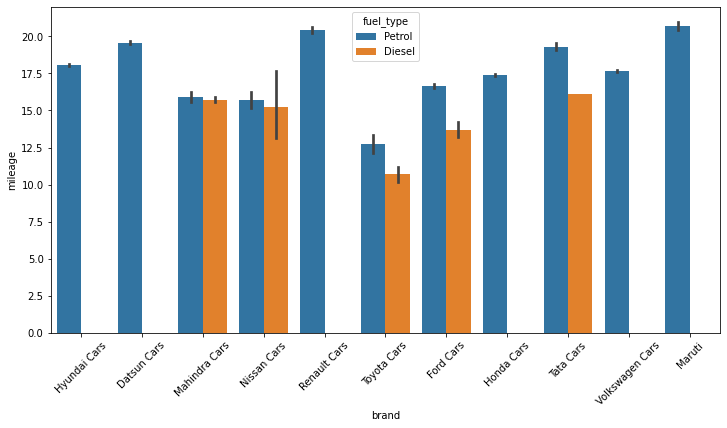

In [12]:
plt.figure(figsize=(12,6))
sns.barplot(data=df,x="brand",y="mileage",hue='fuel_type')
plt.xticks(rotation=45)

By the above plot we conclude, Petrol car's mileage is better than diesel cars

### 2) Mileage of each brands and their body type(individually) 

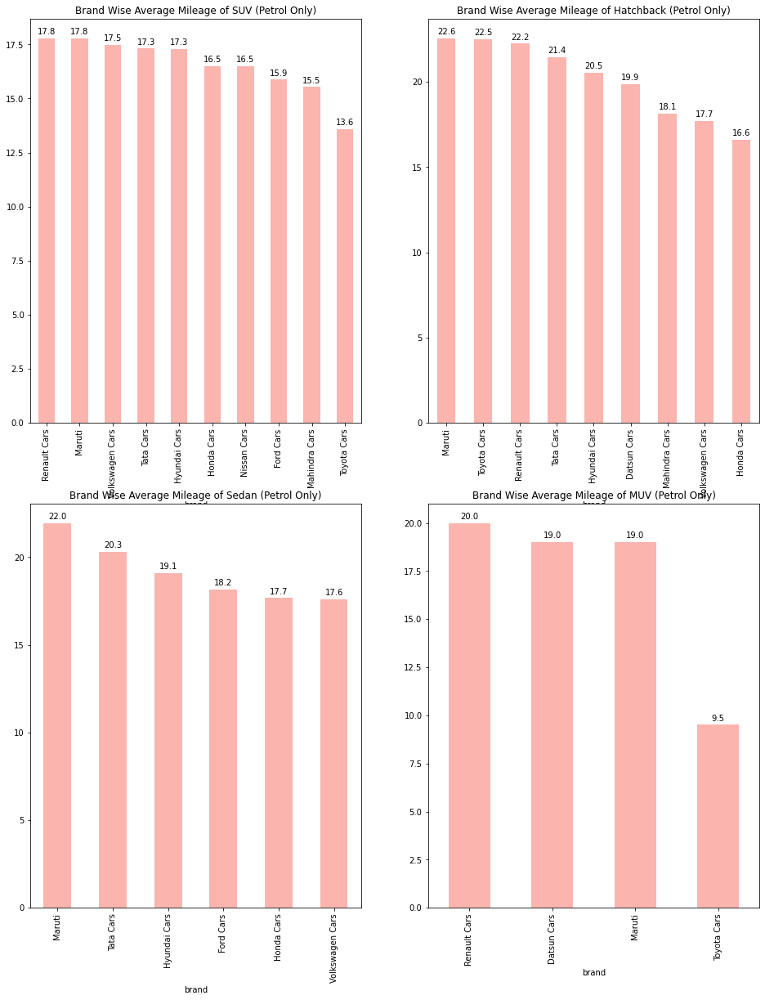

In [13]:
# Splitting data by Petrol and Body Type
petrol_SUV=df[(df['fuel_type']=='Petrol') & (df['body_type']=='SUV')]
petrol_Hatchback=df[(df['fuel_type']=='Petrol') & (df['body_type']=='Hatchback')]
petrol_Sedan=df[(df['fuel_type']=='Petrol') & (df['body_type']=='Sedan')]
petrol_MUV=df[(df['fuel_type']=='Petrol') & (df['body_type']=='MUV')]
plt.figure(figsize=(16,20))

plt.subplot(2,2,1)
plt.title('Brand Wise Average Mileage of SUV (Petrol Only)')
fig=petrol_SUV.groupby("brand")['mileage'].mean().sort_values(ascending=False).plot(kind="bar",colormap='Pastel1')
for bar in fig.patches:
   fig.annotate(format(bar.get_height(), '.1f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                     size=10, xytext=(0, 8),
                     textcoords='offset points')

plt.subplot(2,2,2)
plt.title('Brand Wise Average Mileage of Hatchback (Petrol Only)')
fig=petrol_Hatchback.groupby("brand")['mileage'].mean().sort_values(ascending=False).plot(kind="bar",colormap='Pastel1')
for bar in fig.patches:
   fig.annotate(format(bar.get_height(), '.1f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                     size=10, xytext=(0, 8),
                     textcoords='offset points')

plt.subplot(2,2,3)
plt.title('Brand Wise Average Mileage of Sedan (Petrol Only)')
fig=petrol_Sedan.groupby("brand")['mileage'].mean().sort_values(ascending=False).plot(kind="bar",colormap='Pastel1')
for bar in fig.patches:
   fig.annotate(format(bar.get_height(), '.1f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                     size=10, xytext=(0, 8),
                     textcoords='offset points')

plt.subplot(2,2,4)
plt.title('Brand Wise Average Mileage of MUV (Petrol Only)')
fig=petrol_MUV.groupby("brand")['mileage'].mean().sort_values(ascending=False).plot(kind="bar",colormap='Pastel1')
for bar in fig.patches:
   fig.annotate(format(bar.get_height(), '.1f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                     size=10, xytext=(0, 8),
                     textcoords='offset points')

From the above graphs (petrol only), we can conclude that- <br>
1) For SUV, Maruti, Renault, Volkswagen, Tata and Hyundai cars are giving almost same and better mileage compared to others brand. Whereas, Toyota cars are giving lowest mileage.<br>
2) But for hatchback, Toyota is giving second highest average mileage, which is almost same as Maruti, Renault and Tata. Here, Honda is giving the lowest mileage.,<br>
3) In case of Sedan, Maruti is giving the highest average mileage and Volkswagen is giving the lowest.<br>
4) For MUV, Renault is giving highest mileage, whereas Toyota is giving the lowest mileage.

As we have discussed above about the fuel type, let’s see how fuel tank capacity affects the mileage… 

## Scatter plots:

### 1)  Mileage and Fuel Tank Capacity 

In [14]:
px.scatter(df,x="fuel_tank_capacity",y="mileage",trendline="ols",trendline_color_override="red") 

From the above plot we observed, there is a negative correlation between fuel tank capacity and mileage, which implies that when mileage decreases Fuel Tank capacity increases and vice-versa.

So consequently the increment in Fuel Tank Capacity will also affect the price range of every car.

### 2) Fuel Tank Capacity and Car price 

In [15]:
px.scatter(df,x="fuel_tank_capacity",y="price",trendline="ols",trendline_color_override="green") 

So a positive correlation between price and fuel tank capacity implies that, when fuel tank capacity increases, the price of the car also increases.

### 3) Mileage and Engine Displacement 

In [16]:
px.scatter(df,x="engine_displacement",y="mileage",trendline="ols",trendline_color_override="red")

From the above plot we observed, there is a negative correlation between Engine Displacement and mileage, which implies that, when Mileage decreases Engine Displacement increases and vice-versa.

So consequently the increment in Engine Displacement will also affect the price range of every car.

### 4) Engine Displacement and Car Price

In [17]:
px.scatter(df,x="engine_displacement",y="price",trendline="ols",trendline_color_override="violet")

So a positive correlation between price and Engine Displacement implies that, when fuel tank capacity increases, the price of the car also increases.

Now it's time to proceed into Review column for Text Analysis.

## Handling Review_Date Column
Here we have an unusual review date column which has date and year, we will split the date into month and year.

Let's see top 5 rows of the column first.....

In [18]:
df["review_date"].head()

0   2021-04-16
1   2019-04-21
2   2019-04-20
3   2019-04-14
4   2021-04-08
Name: review_date, dtype: datetime64[ns]

In [19]:
# making separate columns from date column 
df['Day'] = df['review_date'].dt.day
df['Month'] = df['review_date'].dt.month
df['Year'] = df['review_date'].dt.year

df=df.drop(['review_date'], axis=1)

# Day of month vs Reviews count
Let's check if there are any relationship between reviews and day of month

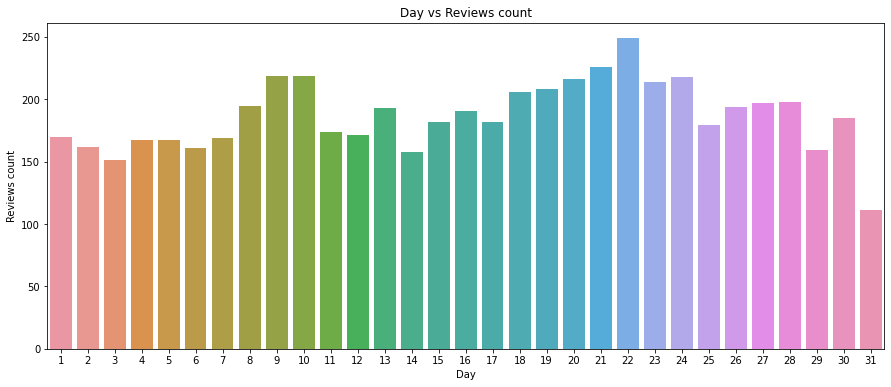

In [20]:
#Creating a dataframe
day=pd.DataFrame(df.groupby('Day')['review'].count()).reset_index()
day['Day']=day['Day'].astype('int64')
day.sort_values(by=['Day'])

#Plotting the graph
plt.figure(figsize=(15,6))
sns.barplot(x="Day", y="review", data=day)
plt.title('Day vs Reviews count')
plt.xlabel('Day')
plt.ylabel('Reviews count')
plt.show()

### Insights :

The review counts are more or less uniformly distributed.There isn't much variance between the days. But there is a huge drop at the end of the month.

## Creating column for Sentiment
This is an important preprocessing phase, we are deciding the outcome column (sentiment_by_rating) based on the rating given by the customer. If the score is greater than 3, we take that as 'positive' and if the value is less than 3 it is 'negative'. If it is equal to 3, we take that as neutral sentiment.

In [21]:
df['sentiment_by_rating'] = df['rating'].apply(lambda rating : 'Positive' if rating > 3
                                                           else('Negative' if rating < 3 else 'Neutral'))

Here, we are checking for the counts of different sentiments. 

In [22]:
df['sentiment_by_rating'].value_counts()

Positive    5053
Negative     572
Neutral      166
Name: sentiment_by_rating, dtype: int64

In [23]:
df.groupby('sentiment_by_rating')['rating'].value_counts()

sentiment_by_rating  rating
Negative             2.5        196
                     1.0        190
                     1.5         94
                     2.0         92
Neutral              3.0        166
Positive             5.0       2340
                     4.5       1288
                     4.0        947
                     3.5        478
Name: rating, dtype: int64

The above table is showing the split of different ratings by sentiment. It is also showing that our intended labelling is done successfully.

## Distribution of Ratings
The below graphs are showing the distribution of ratings for each category of sentiment.

Text(0, 0.5, 'Number of Rating')

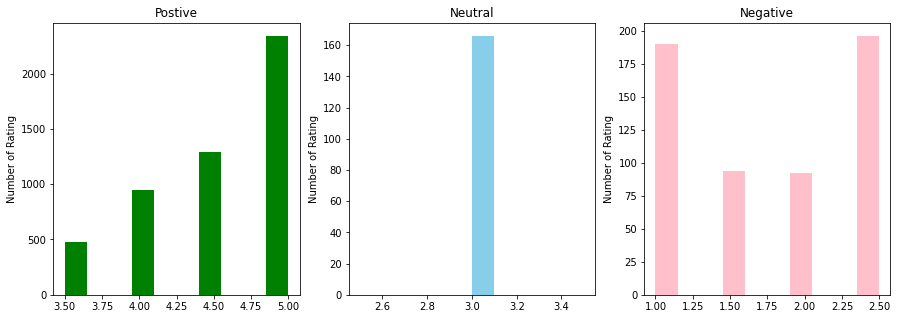

In [24]:
plt.figure(figsize=(15,5))
plt.subplot(131)
df[df['sentiment_by_rating']=='Positive']['rating'].plot(kind='hist',x='review_len',color='green',y='count',title='Postive')
plt.ylabel('Number of Rating')
plt.subplot(132)
df[df['sentiment_by_rating']=='Neutral']['rating'].plot(kind='hist',x='review_len',color='skyblue',y='count',title='Neutral')
plt.ylabel('Number of Rating')
plt.subplot(133)
df[df['sentiment_by_rating']=='Negative']['rating'].plot(kind='hist',x='review_len',color='pink',y='count',title='Negative')
plt.ylabel('Number of Rating')

# Cleaning
We have to do lot of preprocessing before sending the reviews to the model. Now we'll be doing our review text cleaning process by removing punctuation, digits, emoji.

## Review Text Cleaning

In [25]:
# Creating function to make text lowercase, remove text in square brackets,remove links,remove punctuation
# and remove words containing numbers
def review_cleaning(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

# Clean only digits from text
def remove_digits(text1):
    return text1.translate(str.maketrans('','',digits)) 

# Clean emojis from text
def strip_emoji(text):
    return re.sub(emoji.get_emoji_regexp(), r"", text) 

# Applying all the first function on 'review' column
df['review']=df['review'].apply(lambda x:review_cleaning(x))

# Applying all the second function on 'review' column
df['review1']=df['review'].apply(lambda x:remove_digits(x))

# Applying all the third function on 'review' column
df['cleaned_review']=df['review1'].apply(lambda x:strip_emoji(x))

# dropping unnecessary columns
df = df.drop(['review', 'review1'], axis = 1)
df.head()

,brand,car_name,variant_name,model_name,mileage,fuel_type,seat,no_of_cylinder,body_type,transmission_type,...,engine_displacement,price,rating,review_title,view,Day,Month,Year,sentiment_by_rating,cleaned_review
0,Hyundai Cars,Hyundai Creta,Creta E,Hyundai Creta E,16.80,Petrol,5,4,SUV,Manual,...,1497,10.75,1.0,Worst Car.. Sunroof Glass Scattering,3979,16,4,2021,Negative,worst car thing i have noticed car pickup in ...
1,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,...,1086,4.87,1.0,Santro CNG Spotz Model,31,21,4,2019,Negative,i bought a santro cng sportz model no speed se...
2,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,...,1086,4.87,1.0,Celerio vs Santro,38,20,4,2019,Negative,we have both car santro and celerio but we fin...
3,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,...,1086,4.87,1.0,Manufacturing Crank Shaft Defect In Santro,144,14,4,2019,Negative,dear friends i have recently purchased a santr...
4,Hyundai Cars,Hyundai Venue,Venue E,Hyundai Venue E,17.52,Petrol,5,4,SUV,Manual,...,1197,6.99,1.0,Pathetic Car With Zero Safety And Performance,94,8,4,2021,Negative,pathetic car with zero safety and performance ...


## Review Text - Remove Stopwords 

In [26]:
#Let's check Stop Words list first
stop_words = stopwords.words('english')
print(stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

### NOTE :
Coming to stop words, general nltk stop words contains words like not,hasn't,would'nt which actually conveys a negative sentiment. If we remove that it will end up contradicting the sentiments. So we have curated the stop words which doesn't have any negative sentiment or any negative alternatives.

In [27]:
stop_words = [e for e in stop_words if e not in ('no', 'nor', 'not',"don't","hasn't","hadn't","doesn't","aren't", 'couldn', "couldn't", 'didn', "didn't", "aren't", "couldn't",  "didn't","doesn't", "hadn't", "hasn't", "haven't",  "isn't", "mightn't", "mustn't", "needn't",  "shan't",  "shouldn't",  "wasn't", "weren't", "won't", "wouldn't")]
df['cleaned_review'] = df['cleaned_review'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
df.head()

,brand,car_name,variant_name,model_name,mileage,fuel_type,seat,no_of_cylinder,body_type,transmission_type,...,engine_displacement,price,rating,review_title,view,Day,Month,Year,sentiment_by_rating,cleaned_review
0,Hyundai Cars,Hyundai Creta,Creta E,Hyundai Creta E,16.80,Petrol,5,4,SUV,Manual,...,1497,10.75,1.0,Worst Car.. Sunroof Glass Scattering,3979,16,4,2021,Negative,worst car thing noticed car pickup gare worst ...
1,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,...,1086,4.87,1.0,Santro CNG Spotz Model,31,21,4,2019,Negative,bought santro cng sportz model no speed sensor...
2,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,...,1086,4.87,1.0,Celerio vs Santro,38,20,4,2019,Negative,car santro celerio find celerio decent practic...
3,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,...,1086,4.87,1.0,Manufacturing Crank Shaft Defect In Santro,144,14,4,2019,Negative,dear friends recently purchased santro model l...
4,Hyundai Cars,Hyundai Venue,Venue E,Hyundai Venue E,17.52,Petrol,5,4,SUV,Manual,...,1197,6.99,1.0,Pathetic Car With Zero Safety And Performance,94,8,4,2021,Negative,pathetic car zero safety performance number ze...


Now finally it became a cleaned, processed review overall.

# Sentiment Analysis
Sentiment Analysis is the process of ‘computationally’ determining whether a piece of text is positive, negative or neutral. We'll be now putting our hands on sentiment analysis by using TextBlob.....
TextBlob is a python library for Natural Language Processing (NLP).TextBlob actively used Natural Language ToolKit (NLTK) to achieve its tasks. TextBlob is a simple library which supports complex analysis and operations on textual data.

TextBlob returns polarity and subjectivity of a sentence after assigning individual scores to all the words and final sentiment is calculated by some pooling operation like taking an average of all the sentiments. Polarity lies between [-1,1], where -1 defines a negative sentiment and 1 defines a positive sentiment. Negation words reverse the polarity. Subjectivity lies between [0,1]. Subjectivity quantifies the amount of personal opinion and factual information contained in the text.

Now let's create Polarity and Subjectivity score for each reviews..............

In [28]:
df['polarity'] = df['cleaned_review'].map(lambda text: TextBlob(text).sentiment.polarity)
df['subjectivity'] = df['cleaned_review'].map(lambda text:TextBlob(text).sentiment.subjectivity)
df.head()

,brand,car_name,variant_name,model_name,mileage,fuel_type,seat,no_of_cylinder,body_type,transmission_type,...,rating,review_title,view,Day,Month,Year,sentiment_by_rating,cleaned_review,polarity,subjectivity
0,Hyundai Cars,Hyundai Creta,Creta E,Hyundai Creta E,16.80,Petrol,5,4,SUV,Manual,...,1.0,Worst Car.. Sunroof Glass Scattering,3979,16,4,2021,Negative,worst car thing noticed car pickup gare worst ...,-0.689394,0.818182
1,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,...,1.0,Santro CNG Spotz Model,31,21,4,2019,Negative,bought santro cng sportz model no speed sensor...,-0.600000,0.700000
2,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,...,1.0,Celerio vs Santro,38,20,4,2019,Negative,car santro celerio find celerio decent practic...,0.233333,0.833333
3,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,...,1.0,Manufacturing Crank Shaft Defect In Santro,144,14,4,2019,Negative,dear friends recently purchased santro model l...,0.291667,0.329167
4,Hyundai Cars,Hyundai Venue,Venue E,Hyundai Venue E,17.52,Petrol,5,4,SUV,Manual,...,1.0,Pathetic Car With Zero Safety And Performance,94,8,4,2021,Negative,pathetic car zero safety performance number ze...,-0.600000,0.500000


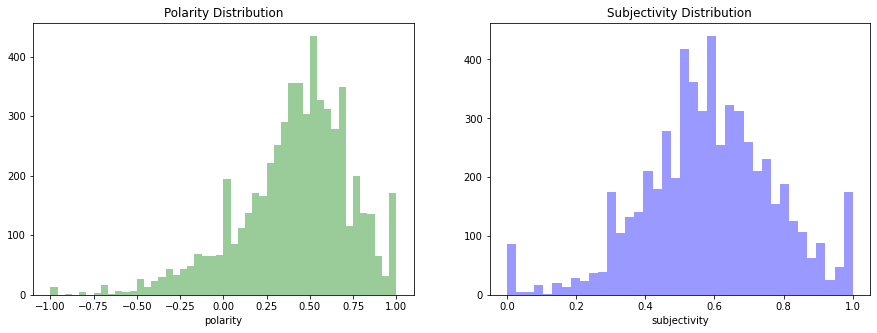

In [29]:
plt.figure(figsize=(15,5))
  
# addind first subplot
plt.subplot(121)
sns.distplot(df["polarity"], kde=False, color= 'g')
plt.title("Polarity Distribution")

# addding second subplot
plt.subplot(122)
sns.distplot(df["subjectivity"], kde=False, color='b')
plt.title("Subjectivity Distribution")
plt.show()

### Insights:

(1)The polarity distribution shows that We have a lot of positive polarities compared to the negative polarities.

(2)The subjectivity distribution shows that all the reviews are highly subjective i.e, based on personal opinions.

# Creating few more features for text analysis
Now, let's create review length and word count......

Review length: length of the review which includes each letters and spaces

Word count: This measures how many words are there in review

In [30]:
df['review_len'] = df['cleaned_review'].astype(str).apply(len)
df['word_count'] = df['cleaned_review'].apply(lambda x: len(str(x).split()))
df.head()

,brand,car_name,variant_name,model_name,mileage,fuel_type,seat,no_of_cylinder,body_type,transmission_type,...,view,Day,Month,Year,sentiment_by_rating,cleaned_review,polarity,subjectivity,review_len,word_count
0,Hyundai Cars,Hyundai Creta,Creta E,Hyundai Creta E,16.80,Petrol,5,4,SUV,Manual,...,3979,16,4,2021,Negative,worst car thing noticed car pickup gare worst ...,-0.689394,0.818182,154,25
1,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,...,31,21,4,2019,Negative,bought santro cng sportz model no speed sensor...,-0.600000,0.700000,131,21
2,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,...,38,20,4,2019,Negative,car santro celerio find celerio decent practic...,0.233333,0.833333,95,13
3,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,...,144,14,4,2019,Negative,dear friends recently purchased santro model l...,0.291667,0.329167,231,34
4,Hyundai Cars,Hyundai Venue,Venue E,Hyundai Venue E,17.52,Petrol,5,4,SUV,Manual,...,94,8,4,2021,Negative,pathetic car zero safety performance number ze...,-0.600000,0.500000,74,11


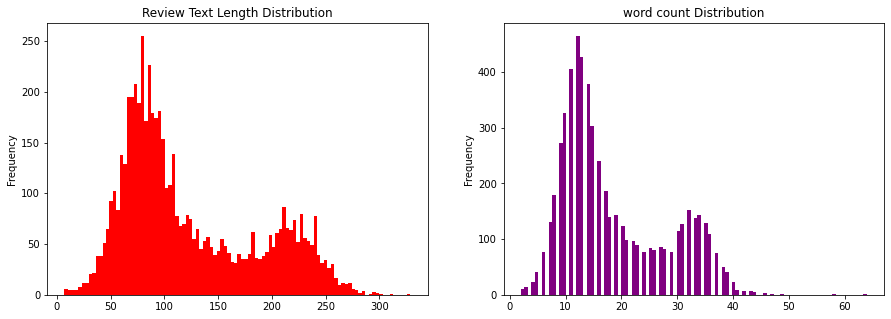

In [31]:
## Let's see the distribution of review length and word count.......
plt.figure(figsize=(15,5))

plt.subplot(121)
df['review_len'].plot( kind='hist',bins=100,x='review_len',color='red',y='count',title='Review Text Length Distribution')

plt.subplot(122)
df['word_count'].plot(kind='hist', bins=100,x='word_count',color='purple',y='count',title='word count Distribution')
plt.show()

### Insights:

(1) we can see maximum review text length falling between 10-250.

(2) we can see maximum most of the words falling between 10-40.

# Label Encoding the target variable- Sentiment

Label Encoding refers to converting the labels into a numeric form so as to convert them into the machine-readable form. It is an important pre-processing step for the structured dataset in supervised learning.

Here it's labelling 'Negative' as 0, 'Neutral' as 1, and 'Positive' as 2.

In [32]:
# Create an instance of LabelEncoder() and store it in label_encoder variable/object
label_encoder = LabelEncoder() 
  
# Encode labels in column 'sentiment'. 
df['sentiment_by_rating']= label_encoder.fit_transform(df['sentiment_by_rating']) 
  
df['sentiment_by_rating'].unique()

array([0, 1, 2])

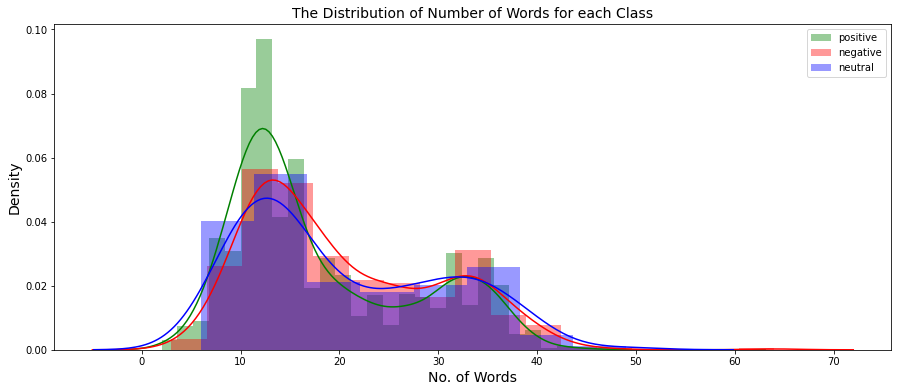

In [33]:
# plotting the distribution of word count
fig = plt.figure(figsize = (15, 6))
sns.distplot(df['word_count'][df['sentiment_by_rating']==2], color='g', label = 'positive')
sns.distplot(df['word_count'][df['sentiment_by_rating']==0], color='r', label = 'negative')
sns.distplot(df['word_count'][df['sentiment_by_rating']==1], color='b', label = 'neutral')
plt.legend(loc='best')
plt.xlabel('No. of Words', size = 14)
plt.ylabel('Density', size = 14)
plt.title('The Distribution of Number of Words for each Class', fontsize = 14)
plt.show()

Now we can clearly see that each categorisation of sentiments i.e, positive, negative and neutral has the symmetrical distribution...

# Frequency Analysis

## 1) Words Comparison- WordCloud

Let's go into more deeper of text analysis accordingly. Using the Wordcloud package we will be able to generate an image that gives us the most representative words (actually the more common) in a chosen set of reviews i.e, positive, negative and neutral....

## Wordcloud-Positive reviews

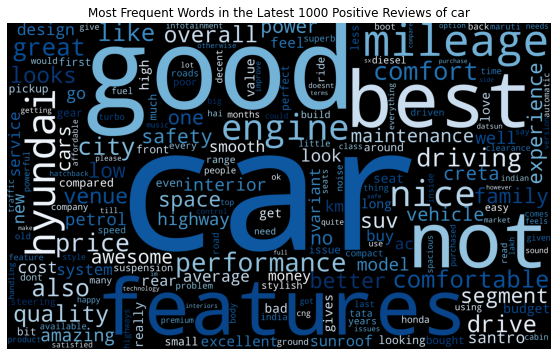

In [34]:
def word_freq_dict(text):
    # Convert text into word list
    wordList = text.split()
    # Generate word freq dictionary
    wordFreqDict = {word: wordList.count(word) for word in wordList}
    return wordFreqDict

def wordcloud_from_frequency(word_freq_dict, title, figure_size=(10, 6)):
    wordcloud.generate_from_frequencies(word_freq_dict)
    plt.figure(figsize=figure_size)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title(title)
    plt.show()
    
review_pos = " ".join(df[df["sentiment_by_rating"]==2]["cleaned_review"][0:1000])
pos_word_freq = word_freq_dict(review_pos)
wordcloud = WordCloud(width=5000, 
                      height=3000, 
                      max_words=200, 
                      colormap="Blues",
                      background_color="black")
wordcloud_from_frequency(pos_word_freq, "Most Frequent Words in the Latest 1000 Positive Reviews of car")

We can see positive words like best, great, awesome etc.

## Wordcloud-Neutral reviews

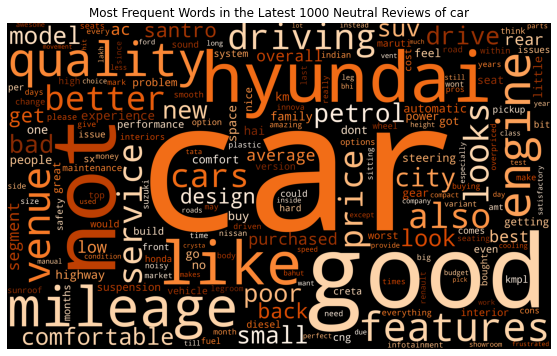

In [35]:
def word_freq_dict(text):
    # Convert text into word list
    wordList = text.split()
    # Generate word freq dictionary
    wordFreqDict = {word: wordList.count(word) for word in wordList}
    return wordFreqDict

def wordcloud_from_frequency(word_freq_dict, title, figure_size=(10, 6)):
    wordcloud.generate_from_frequencies(word_freq_dict)
    plt.figure(figsize=figure_size)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title(title)
    plt.show()
    
review_neu = " ".join(df[df["sentiment_by_rating"]==1]["cleaned_review"][0:1000])
neu_word_freq = word_freq_dict(review_neu)
wordcloud = WordCloud(width=5000, 
                      height=3000, 
                      max_words=200, 
                      colormap="Oranges",
                      background_color="black")
wordcloud_from_frequency(neu_word_freq, "Most Frequent Words in the Latest 1000 Neutral Reviews of car")

We can see most of the neutral review words are focused on the products and how can they be improved.

## Wordcloud-Negative reviews

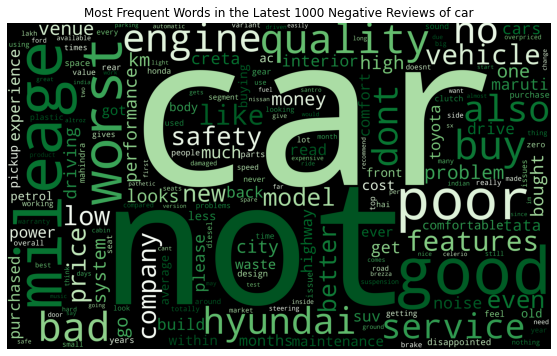

In [36]:
def word_freq_dict(text):
    # Convert text into word list
    wordList = text.split()
    # Generate word freq dictionary
    wordFreqDict = {word: wordList.count(word) for word in wordList}
    return wordFreqDict

def wordcloud_from_frequency(word_freq_dict, title, figure_size=(10, 6)):
    wordcloud.generate_from_frequencies(word_freq_dict)
    plt.figure(figsize=figure_size)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title(title)
    plt.show()
    
review_neg = " ".join(df[df["sentiment_by_rating"]==0]["cleaned_review"][0:1000])
neg_word_freq = word_freq_dict(review_neg)
wordcloud = WordCloud(width=5000, 
                      height=3000, 
                      max_words=200, 
                      colormap="Greens",
                      background_color="black")
wordcloud_from_frequency(neg_word_freq, "Most Frequent Words in the Latest 1000 Negative Reviews of car")

We can see negative review words such as poor, bad etc.

## 2) N-Gram Analysis

 ## Unigram Analysis
Create unigrams for each of the review records belonging to each of the three categories of sentiments

(1) Store the word and its count in the corresponding dictionaries

(2) Convert these dictionaries to corresponding data frames

(3) Fetch the top 10 most frequently used words

(4) Visualize the most frequently used words for all the 3 categories-positive, negative and neutral.

In [37]:
#create sub dataframe for each of the sentiment classes
review_pos = df[df["sentiment_by_rating"]==2]
review_neu = df[df["sentiment_by_rating"]==1]
review_neg = df[df["sentiment_by_rating"]==0]

# Method to generate n-grams
def generate_N_grams(text,ngram=1):
  words=[word for word in text.split(" ") if word not in set(stopwords.words('english'))]  
  print("Sentence after removing stopwords:",words)
  temp=zip(*[words[i:] for i in range(0,ngram)])
  ans=[' '.join(ngram) for ngram in temp]
  return ans

In [38]:
positiveValues=defaultdict(int)
negativeValues=defaultdict(int)
neutralValues=defaultdict(int)

# get the count of every word in cleaned review column where sentiment="positive"
for text in review_pos[review_pos.sentiment_by_rating == 2].cleaned_review:
  for word in generate_N_grams(text):
    positiveValues[word]+=1
    
# get the count of every word in cleaned review column where sentiment="negative"    
for text in review_neg[review_neg.sentiment_by_rating == 0].cleaned_review:
  for word in generate_N_grams(text):
    negativeValues[word]+=1
    
# get the count of every word in cleaned review column where sentiment="neutral"    
for text in review_neu[review_neu.sentiment_by_rating == 1].cleaned_review:
  for word in generate_N_grams(text):
    neutralValues[word]+=1
    
df_positive=pd.DataFrame(sorted(positiveValues.items(),key=lambda x:x[1],reverse=True))
df_negative=pd.DataFrame(sorted(negativeValues.items(),key=lambda x:x[1],reverse=True))
df_neutral=pd.DataFrame(sorted(neutralValues.items(),key=lambda x:x[1],reverse=True))

Sentence after removing stopwords: ['headlights', 'car', 'work', 'like', 'nothing', 'mobile', 'flashlight', 'person', 'travels', 'lot', 'especially', 'night', 'please', 'dont', 'buy', 'car', 'least', 'dont', 'buy', 'top', 'end', 'sxo']
Sentence after removing stopwords: ['great', 'design', 'comfortable', 'car', 'decade']
Sentence after removing stopwords: ['really', 'happy', 'decision', 'buy', 'car', 'comfortable', 'stylish', 'fulfils', 'requirements', 'keeps', 'happy', 'road']
Sentence after removing stopwords: ['purchased', 'creta', 'around', 'year', 'ago', 'experience', 'car', 'quite', 'good', 'comfortable', 'gives', 'good', 'mileage', 'cheapest', 'maintenance']
Sentence after removing stopwords: ['good', 'quality', 'looks', 'good', 'better', 'performance', 'car', 'interior', 'better']
Sentence after removing stopwords: ['overall', 'excellent', 'variant', 'look', 'comfort', 'safety', 'point', 'view', 'good', 'ground', 'clearance', 'good']
Sentence after removing stopwords: ['using',

In [39]:
pd1=df_positive[0][:10]
pd2=df_positive[1][:10]

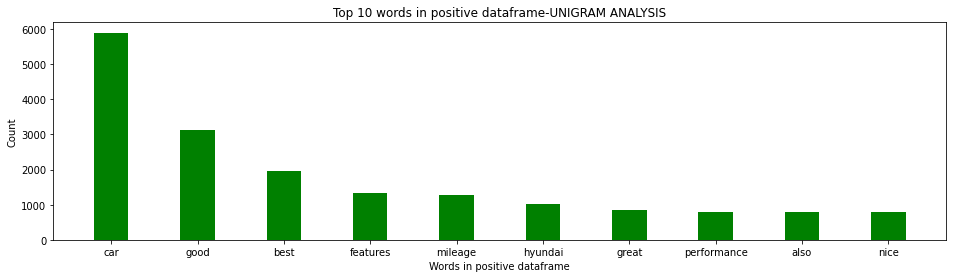

In [40]:
# plotting positive dataframe(unigram) 
plt.figure(1,figsize=(16,4))
plt.bar(pd1, pd2, color ='green', width = 0.4)
plt.xlabel("Words in positive dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in positive dataframe-UNIGRAM ANALYSIS")
plt.show()

In [41]:
ned1=df_negative[0][:10]
ned2=df_negative[1][:10]

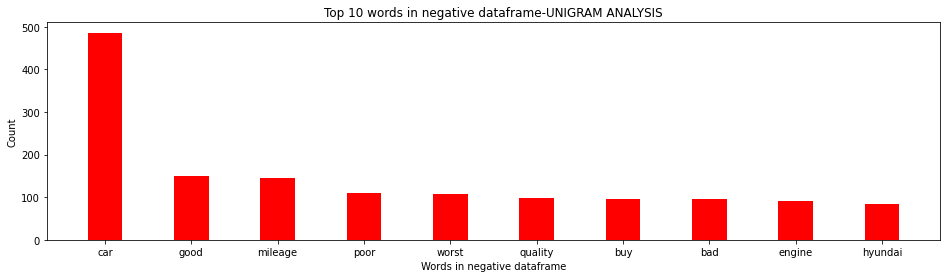

In [42]:
# plotting negative dataframe(unigram)
plt.figure(1,figsize=(16,4))
plt.bar(ned1, ned2, color ='red', width = 0.4)
plt.xlabel("Words in negative dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in negative dataframe-UNIGRAM ANALYSIS")
plt.show()

In [43]:
nud1=df_neutral[0][:10]
nud2=df_neutral[1][:10]

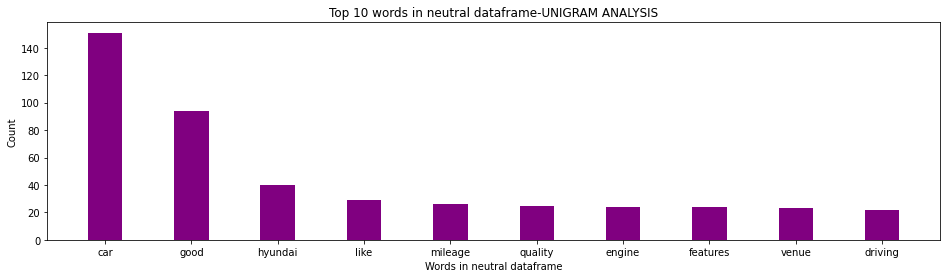

In [44]:
# plotting neutral dataframe(unigram)
plt.figure(1,figsize=(16,4))
plt.bar(nud1, nud2, color ='purple', width = 0.4)
plt.xlabel("Words in neutral dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in neutral dataframe-UNIGRAM ANALYSIS")
plt.show()

## Bigram Analysis

We are repeating the same steps which we followed to analyze our data using unigrams except that we have passed parameter 2 while invoking the generate_N_grams() function. We also have changed the name of the dataframes here.

In [45]:
positiveValues2=defaultdict(int)
negativeValues2=defaultdict(int)
neutralValues2=defaultdict(int)

# get the count of every word in cleaned review column where sentiment="positive"
for text in review_pos[review_pos.sentiment_by_rating == 2].cleaned_review:
  for word in generate_N_grams(text, 2):
    positiveValues2[word]+=1
    
# get the count of every word in cleaned review column where sentiment="negative"      
for text in review_neg[review_neg.sentiment_by_rating == 0].cleaned_review:
  for word in generate_N_grams(text, 2):
    negativeValues2[word]+=1
    
# get the count of every word in cleaned review column where sentiment="neutral"    
for text in review_neu[review_neu.sentiment_by_rating == 1].cleaned_review:
  for word in generate_N_grams(text, 2):
    neutralValues2[word]+=1
    
df_positive2=pd.DataFrame(sorted(positiveValues2.items(),key=lambda x:x[1],reverse=True))
df_negative2=pd.DataFrame(sorted(negativeValues2.items(),key=lambda x:x[1],reverse=True))
df_neutral2=pd.DataFrame(sorted(neutralValues2.items(),key=lambda x:x[1],reverse=True))

Sentence after removing stopwords: ['headlights', 'car', 'work', 'like', 'nothing', 'mobile', 'flashlight', 'person', 'travels', 'lot', 'especially', 'night', 'please', 'dont', 'buy', 'car', 'least', 'dont', 'buy', 'top', 'end', 'sxo']
Sentence after removing stopwords: ['great', 'design', 'comfortable', 'car', 'decade']
Sentence after removing stopwords: ['really', 'happy', 'decision', 'buy', 'car', 'comfortable', 'stylish', 'fulfils', 'requirements', 'keeps', 'happy', 'road']
Sentence after removing stopwords: ['purchased', 'creta', 'around', 'year', 'ago', 'experience', 'car', 'quite', 'good', 'comfortable', 'gives', 'good', 'mileage', 'cheapest', 'maintenance']
Sentence after removing stopwords: ['good', 'quality', 'looks', 'good', 'better', 'performance', 'car', 'interior', 'better']
Sentence after removing stopwords: ['overall', 'excellent', 'variant', 'look', 'comfort', 'safety', 'point', 'view', 'good', 'ground', 'clearance', 'good']
Sentence after removing stopwords: ['using',

In [46]:
pd1bi=df_positive2[0][:10]
pd2bi=df_positive2[1][:10]

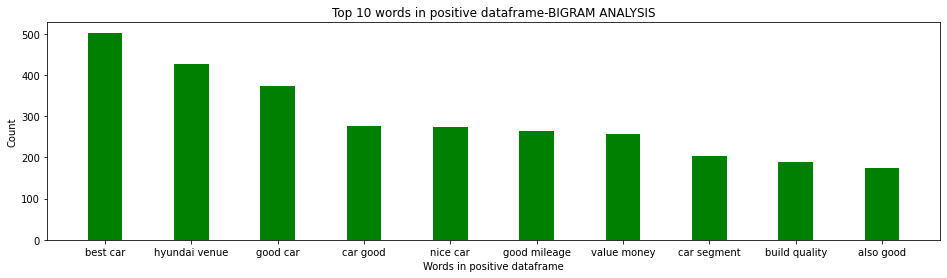

In [47]:
# plotting positive dataframe(bigram)
plt.figure(1,figsize=(16,4))
plt.bar(pd1bi, pd2bi, color ='green', width = 0.4)
plt.xlabel("Words in positive dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in positive dataframe-BIGRAM ANALYSIS")
plt.show()

In [48]:
ned1bi=df_negative2[0][:10]
ned2bi=df_negative2[1][:10]

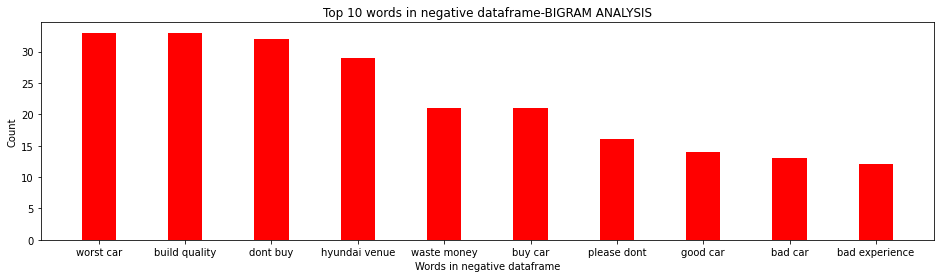

In [49]:
# plotting negative dataframe(bigram)
plt.figure(1,figsize=(16,4))
plt.bar(ned1bi, ned2bi, color ='red', width = 0.4)
plt.xlabel("Words in negative dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in negative dataframe-BIGRAM ANALYSIS")
plt.show()

In [50]:
nud1bi=df_neutral2[0][:10]
nud2bi=df_neutral2[1][:10]

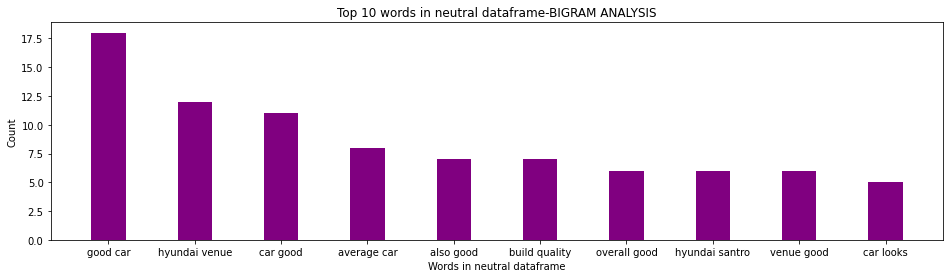

In [51]:
# plotting neutral dataframe(bigram)
plt.figure(1,figsize=(16,4))
plt.bar(nud1bi, nud2bi, color ='purple', width = 0.4)
plt.xlabel("Words in neutral dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in neutral dataframe-BIGRAM ANALYSIS")
plt.show()

## Trigram Analysis

We are repeating the same steps which we followed to analyze our data using unigrams except that we have passed parameter 3 while invoking the generate_N_grams() function. We also have changed the name of the dataframes here.

In [52]:
positiveValues3=defaultdict(int)
negativeValues3=defaultdict(int)
neutralValues3=defaultdict(int)

# get the count of every word in cleaned review column where sentiment="positive"
for text in review_pos[review_pos.sentiment_by_rating==2].cleaned_review:
  for word in generate_N_grams(text, 3):
    positiveValues3[word]+=1
    
# get the count of every word in cleaned review column where sentiment="negative"    
for text in review_neg[review_neg.sentiment_by_rating==0].cleaned_review:
  for word in generate_N_grams(text, 3):
    negativeValues3[word]+=1
    
# get the count of every word in cleaned review column where sentiment="neutral"    
for text in review_neu[review_neu.sentiment_by_rating==1].cleaned_review:
  for word in generate_N_grams(text, 3):
    neutralValues3[word]+=1
    
df_positive3=pd.DataFrame(sorted(positiveValues3.items(),key=lambda x:x[1],reverse=True))
df_negative3=pd.DataFrame(sorted(negativeValues3.items(),key=lambda x:x[1],reverse=True))
df_neutral3=pd.DataFrame(sorted(neutralValues3.items(),key=lambda x:x[1],reverse=True))

Sentence after removing stopwords: ['headlights', 'car', 'work', 'like', 'nothing', 'mobile', 'flashlight', 'person', 'travels', 'lot', 'especially', 'night', 'please', 'dont', 'buy', 'car', 'least', 'dont', 'buy', 'top', 'end', 'sxo']
Sentence after removing stopwords: ['great', 'design', 'comfortable', 'car', 'decade']
Sentence after removing stopwords: ['really', 'happy', 'decision', 'buy', 'car', 'comfortable', 'stylish', 'fulfils', 'requirements', 'keeps', 'happy', 'road']
Sentence after removing stopwords: ['purchased', 'creta', 'around', 'year', 'ago', 'experience', 'car', 'quite', 'good', 'comfortable', 'gives', 'good', 'mileage', 'cheapest', 'maintenance']
Sentence after removing stopwords: ['good', 'quality', 'looks', 'good', 'better', 'performance', 'car', 'interior', 'better']
Sentence after removing stopwords: ['overall', 'excellent', 'variant', 'look', 'comfort', 'safety', 'point', 'view', 'good', 'ground', 'clearance', 'good']
Sentence after removing stopwords: ['using',

In [53]:
pd1tri=df_positive3[0][:10]
pd2tri=df_positive3[1][:10]

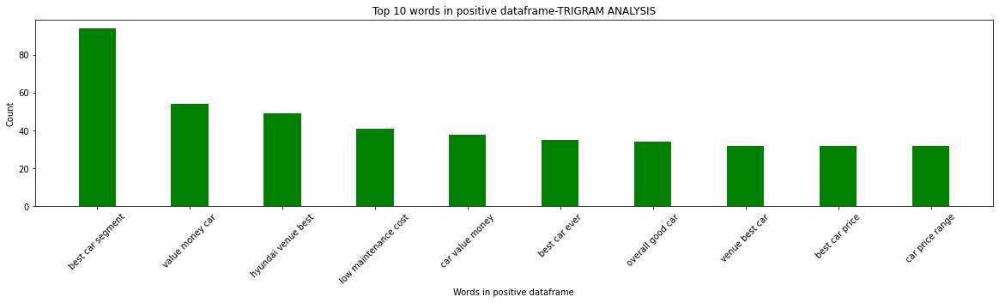

In [54]:
# plotting positive dataframe(trigram)
plt.figure(1,figsize=(20,4))
plt.bar(pd1tri, pd2tri, color ='green', width = 0.4)
plt.xlabel("Words in positive dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in positive dataframe-TRIGRAM ANALYSIS")
plt.xticks(rotation = 45)
plt.show()

In [55]:
ned1tri=df_negative3[0][:10]
ned2tri=df_negative3[1][:10]

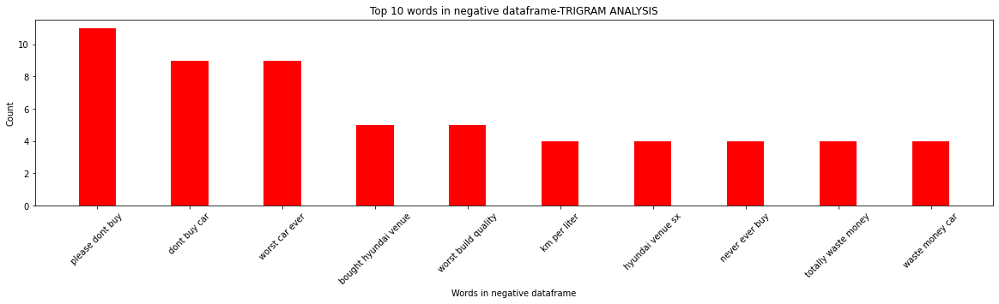

In [56]:
# plotting negative dataframe(trigram)
plt.figure(1,figsize=(20,4))
plt.bar(ned1tri, ned2tri, color ='red', width = 0.4)
plt.xlabel("Words in negative dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in negative dataframe-TRIGRAM ANALYSIS")
plt.savefig("negative-Trigram.png")
plt.xticks(rotation = 45)
plt.show()

In [57]:
nud1tri=df_neutral3[0][:10]
nud2tri=df_neutral3[1][:10]

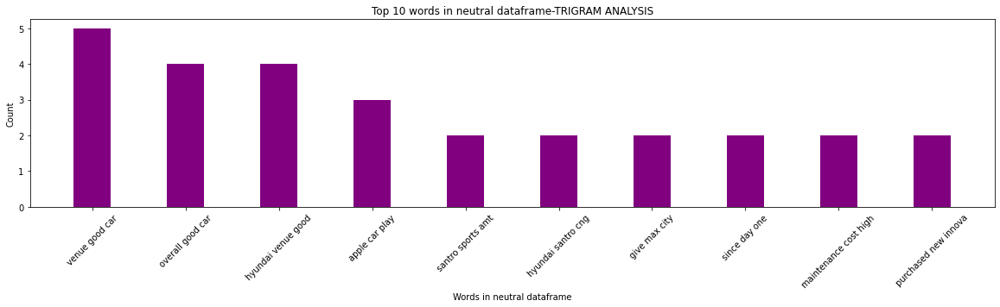

In [58]:
# plotting neutral dataframe(trigram)
plt.figure(1,figsize=(20,4))
plt.bar(nud1tri, nud2tri, color ='purple', width = 0.4)
plt.xlabel("Words in neutral dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in neutral dataframe-TRIGRAM ANALYSIS")
plt.xticks(rotation = 45)
plt.show()

Now it's needed to tokenize the words of cleaned review column to perform tfidf vectorization. Here we go now....

In [59]:
#tokenizing
df['tokenized_sents'] = df.apply(lambda row: nltk.word_tokenize(row['cleaned_review']), axis=1)
df.head()

,brand,car_name,variant_name,model_name,mileage,fuel_type,seat,no_of_cylinder,body_type,transmission_type,...,Day,Month,Year,sentiment_by_rating,cleaned_review,polarity,subjectivity,review_len,word_count,tokenized_sents
0,Hyundai Cars,Hyundai Creta,Creta E,Hyundai Creta E,16.80,Petrol,5,4,SUV,Manual,...,16,4,2021,0,worst car thing noticed car pickup gare worst ...,-0.689394,0.818182,154,25,"[worst, car, thing, noticed, car, pickup, gare..."
1,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,...,21,4,2019,0,bought santro cng sportz model no speed sensor...,-0.600000,0.700000,131,21,"[bought, santro, cng, sportz, model, no, speed..."
2,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,...,20,4,2019,0,car santro celerio find celerio decent practic...,0.233333,0.833333,95,13,"[car, santro, celerio, find, celerio, decent, ..."
3,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,...,14,4,2019,0,dear friends recently purchased santro model l...,0.291667,0.329167,231,34,"[dear, friends, recently, purchased, santro, m..."
4,Hyundai Cars,Hyundai Venue,Venue E,Hyundai Venue E,17.52,Petrol,5,4,SUV,Manual,...,8,4,2021,0,pathetic car zero safety performance number ze...,-0.600000,0.500000,74,11,"[pathetic, car, zero, safety, performance, num..."


# TFIDF(Term Frequency — Inverse Document Frequency)

In [60]:
def identity_tokenizer(text):
    return text

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, stop_words='english', max_features=5000,
                        lowercase=False, ngram_range=(2,2))    
x = tfidf.fit_transform(df['tokenized_sents'])
print('list:', tfidf.vocabulary_)

list: {'worst car': 4952, 'car thing': 854, 'thing noticed': 4672, 'noticed car': 3338, 'car pickup': 761, 'mileage km': 3099, 'km liter': 2644, 'liter petrol': 2779, 'petrol version': 3551, 'build quality': 469, 'bought santro': 426, 'santro cng': 4054, 'sportz model': 4392, 'door lock': 1413, 'passenger airbags': 3425, 'parking camera': 3418, 'car santro': 799, 'recently purchased': 3919, 'purchased santro': 3805, 'santro model': 4063, 'time purchase': 4698, 'purchase vehicle': 3797, 'km days': 2637, 'problems like': 3764, 'pickup mileage': 3567, 'hyundai service': 2489, 'car zero': 891, 'zero safety': 4993, 'safety performance': 4040, 'waste money': 4924, 'lakh price': 2673, 'mahindra scorpio': 2981, 'scorpio car': 4084, 'car doesnt': 593, 'keyless entry': 2625, 'climate control': 1018, 'features like': 1888, 'creta e': 1270, 'base model': 213, 'model worst': 3171, 'hyundai provide': 2485, 'basic feature': 215, 'e model': 1560, 'dont buy': 1397, 'buy new': 492, 'new hyundai': 3252, 

In [61]:
#checking the shape of x
x.shape

(5791, 5000)

As we have considered 5000 words, we can confirm that we have 5000 columns from the shape.

In [62]:
# Getting the target variable(encoded)
y = df['sentiment_by_rating']

# Handling Imbalance (SMOTE Method)

In [63]:
print(f'Original dataset shape : {Counter(y)}')

smote = SMOTE(random_state=42)
x_res, y_res = smote.fit_resample(x, y)

print(f'Resampled dataset shape {Counter(y_res)}')

Original dataset shape : Counter({2: 5053, 0: 572, 1: 166})
Resampled dataset shape Counter({0: 5053, 1: 5053, 2: 5053})


# Train-test split(80:20)
Using train test split function we are splitting the dataset into 80:20 ratio for train and test set respectively.

In [64]:
## Divide the dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x_res, y_res, test_size=0.20, random_state=0)

# Model selection
Here we are using cross validaton first to select the best peforming model . Let's consider all the classification algorithms and perform the model selection process.

In [65]:
#creating the objects
randomfor = RandomForestClassifier(random_state=0)
logreg_cv = LogisticRegression(random_state=0)
dt_cv=DecisionTreeClassifier(random_state=0)
knn_cv=KNeighborsClassifier()
svc_cv=SVC(random_state=0)
nb_cv=BernoulliNB()
cv_dict = {0: 'random forest', 1: 'Logistic Regression', 2: 'Decision Tree',3:'KNN',4:'SVC',5:'Naive Bayes'}
cv_models=[randomfor,logreg_cv,dt_cv,knn_cv,svc_cv,nb_cv]


for i,model in enumerate(cv_models):
    print("{} Test Accuracy: {}".format(cv_dict[i],cross_val_score(model, x, y, cv=10, scoring ='accuracy').mean()))

random forest Test Accuracy: 0.8888020368054315
Logistic Regression Test Accuracy: 0.8843040914775774
Decision Tree Test Accuracy: 0.8459796915013996
KNN Test Accuracy: 0.7634384491691977
SVC Test Accuracy: 0.8811970698588529
Naive Bayes Test Accuracy: 0.8696325412423322


### NOTE:

We have used (x, y) which is the imbalanced dataset instead of the resampled one that is (x_res, y_res) as Cross Validation doesn't get affected by imbalanced dataset. It splits the dataset and considers the average of all the Cross Validations.

Since Logistic Regression depends on a calculation based on ‘weights’, numerical encoding of categorical variables can lead the algorithm to treat certain categories are of higher importance compared to others, depending on the number assigned.For the purpose of giving 'weights' to texts, we have already performed TF-IDF.
So as for model selection, we are choosing Logistic Regression, outdone the rest of the algorithms and all the accuracies from the results are more than 80%. 

# Stratified K Fold (Cross Validation Method)
Now to talk about the above 'imbalanced' statement, there is one more cross validation method called stratified k fold which splits the data based on equal proportion of classes without any oversampling/undersampling. It does stratified sampling instead of random sampling.

Here we have taken the resampled data, which was being performed by SMOTE and now the cross validation will take place within each fold.

In [66]:
# Create classifier object
logreg=LogisticRegression()

# Create StratifiedKFold object
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)
lst_accu_stratified = []
  
    
for train_index, test_index in skf.split(x, y):
    x_train_fold, x_test_fold = x_res[train_index], x_res[test_index]
    y_train_fold, y_test_fold = y_res[train_index], y_res[test_index]
    logreg.fit(x_train_fold, y_train_fold)
    lst_accu_stratified.append(logreg.score(x_test_fold, y_test_fold))
  
# Print the output.
print('List of possible accuracy:', lst_accu_stratified)
print('\nMaximum Accuracy That can be obtained from this model is:',
      max(lst_accu_stratified)*100, '%')
print('\nMinimum Accuracy:',
      min(lst_accu_stratified)*100, '%')
print('\nOverall Accuracy:',
      mean(lst_accu_stratified)*100, '%')
print('\nStandard Deviation is:', stdev(lst_accu_stratified))

List of possible accuracy: [0.8827586206896552, 0.8911917098445595, 0.8842832469775475, 0.8842832469775475, 0.8808290155440415, 0.8773747841105354, 0.8877374784110535, 0.8877374784110535, 0.8894645941278065, 0.8894645941278065]

Maximum Accuracy That can be obtained from this model is: 89.11917098445595 %

Minimum Accuracy: 87.73747841105354 %

Overall Accuracy: 88.55124769221607 %

Standard Deviation is: 0.00437360774154122


# Logistic Regression with Hyperparameter tuning
The classification models run with the default parameters determined by the classifier modules. Regularization parameter and penality for parameter has been used for tuning. From here we can see which one to plug.

In [67]:
param_grid = {'C': np.logspace(-4, 4, 50),
             'penalty':['l1', 'l2']}
clf = GridSearchCV(LogisticRegression(random_state=0), param_grid, cv=5, verbose=0, n_jobs=-1)
best_model = clf.fit(x_train,y_train)
print(best_model.best_estimator_)
print("The mean accuracy of the model is:",best_model.score(x_test,y_test))

LogisticRegression(C=10000.0, random_state=0)
The mean accuracy of the model is: 0.974934036939314


In [68]:
#Now we can easily put the values and improve the model accuracy
logreg = LogisticRegression(C = 10000.0, random_state=0)
logreg.fit(x_train, y_train)
y_pred = logreg.predict(x_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(x_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.97


# Checking for Underfitting/Overfitting

In [69]:
# Checking for Overfitting or Underfitting the data

print("Training set score: {:.4f}".format(logreg.score(x_train,y_train)))

print("Test set score: {:.4f}".format(logreg.score(x_test,y_test)))

Training set score: 0.9965
Test set score: 0.9749


# Classification Metrics

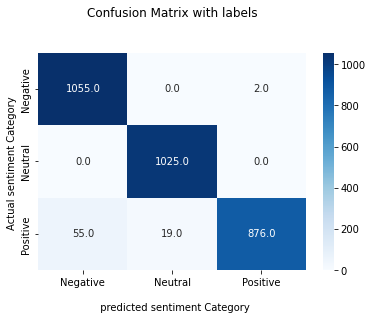

In [70]:
#creating confusion matrix 
cm = confusion_matrix(y_test,y_pred)

##Generating heatmap to visualize the confusion matrix
ax = sns.heatmap(cm, annot=True, cmap='Blues', fmt=".1f")

##Setting up the title and Labels
ax.set_title('Confusion Matrix with labels\n\n');
ax.set_xlabel('\n  predicted sentiment Category')
ax.set_ylabel('Actual sentiment Category ');

##Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['Negative','Neutral', 'Positive'])
ax.yaxis.set_ticklabels(['Negative','Neutral', 'Positive'])
plt.show()

In [71]:
print("Classification Report:\n",classification_report(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       0.95      1.00      0.97      1057
           1       0.98      1.00      0.99      1025
           2       1.00      0.92      0.96       950

    accuracy                           0.97      3032
   macro avg       0.98      0.97      0.97      3032
weighted avg       0.98      0.97      0.97      3032



# ROC-AUC curve
This is a very important curve to decide on which threshold to setup based upon the objective criteria. Here we plotted ROC for different classes which can help us to understand which class was classified better. Micro and Macro averages are also plotted on the roc curve.

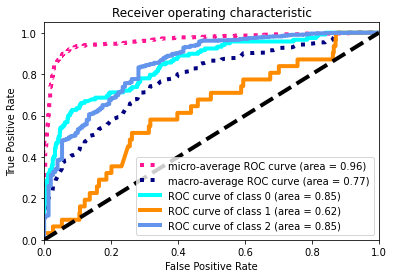

In [72]:
#Binarizing the target feature
y = label_binarize(y, classes=[0, 1, 2])
n_classes = y.shape[1]

#Train-Test split(80:20)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.2,
                                                    random_state=0)

#OneVsRestClassifier
classifier = OneVsRestClassifier(svm.SVC(kernel='linear', probability=True,
                                 random_state=10))
y_score = classifier.fit(x_train, y_train).decision_function(x_test)

#Computing TPR and FPR
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
# aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=4,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=4)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

### Insights:

Considering the ROC curve, class 0 and 2 have been classified well and their area under the curve is high. Any threshold between 0.6-0.9 can be chosen to get the optimal number of TPR and FPR.

Coming to micro and macro average, micro average preforms really well and macro average shows a not very good score.

In a multi-class classification setup, micro-average is preferable.

After the implementation of sentiment classification, we got the values of sentiment distribution of all the car brands. The sum and mean of the Ratings and Sentiments have also been determined. Let’s see, what are the top 10 car brands and car models according to Sentiments classes and given Ratings of the users. 

In [73]:
#top 10 car brands
testing = pd.pivot_table(df,index=['brand'],values=['rating','sentiment_by_rating'],
               columns=[],aggfunc=[np.sum, np.mean],fill_value=0)
testing = testing.sort_values(by=('sum', 'rating'), ascending = False)
print(testing.head(10))

                     sum                          mean                    
                  rating sentiment_by_rating    rating sentiment_by_rating
brand                                                                     
Hyundai Cars     11528.5                4815  4.368511            1.824555
Mahindra Cars     2397.0                 996  4.242478            1.762832
Tata Cars         2389.5                1029  4.192105            1.805263
Maruti            1524.0                 632  3.887755            1.612245
Ford Cars         1281.0                 541  4.479021            1.891608
Renault Cars      1089.5                 458  3.631667            1.526667
Volkswagen Cars   1030.0                 458  4.186992            1.861789
Honda Cars        1022.5                 432  4.260417            1.800000
Toyota Cars        803.0                 330  3.842105            1.578947
Datsun Cars        698.5                 294  3.880556            1.633333


In [74]:
#top10 car models
testing1 = pd.pivot_table(df,index=['model_name'],values=['rating','sentiment_by_rating'],
               columns=[],aggfunc=[np.sum, np.mean],fill_value=0)
testing1 = testing1.sort_values(by=('sum', 'rating'), ascending = False)
print(testing1.head(10))

                                      sum                          mean  \
                                   rating sentiment_by_rating    rating   
model_name                                                                
Hyundai Venue E                    6317.0                2604  4.486506   
Hyundai Creta E                    2253.5                 979  4.173148   
Hyundai Santro Era Executive       1726.5                 718  4.426923   
Hyundai i20 Magna                   828.5                 342  3.945238   
Volkswagen Polo 1.0 MPI Trendline   703.5                 317  4.187500   
Honda City 4th Generation SV MT     526.5                 227  4.387500   
Mahindra Marazzo M2                 519.5                 210  4.329167   
Tata Harrier XE                     519.5                 213  4.329167   
Mahindra Scorpio S3 Plus            508.5                 221  4.237500   
Mahindra XUV300 W4                  507.0                 213  4.225000   

                        

Above figure displays that Hyundai Cars are much popular among the car users.

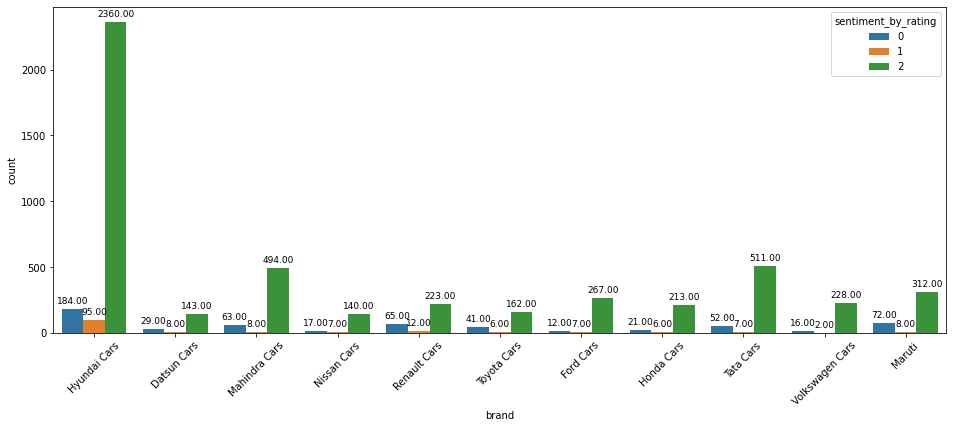

In [75]:
plt.figure(figsize=(16,6))
fig=sns.countplot(data=df,x="brand",hue="sentiment_by_rating")
plt.xticks(rotation=45)
for bar in fig.patches:
   
    fig.annotate(format(bar.get_height(), '.2f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                     size=9, xytext=(0, 8),
                     textcoords='offset points')

It was found that the counts of the positive reviews of Hyundai are much more than the rest of the brands from the above figure. Let’s have a look more insights of Hyundai cars.....

<AxesSubplot:title={'center':'Sentiment distribution of Hyundai car'}>

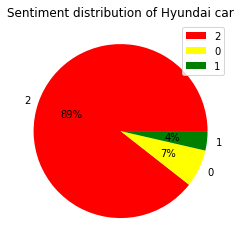

In [76]:
df.loc[df['brand'] == 'Hyundai Cars'].sentiment_by_rating.value_counts().plot(kind='pie', autopct='%1.0f%%', ylabel='', title='Sentiment distribution of Hyundai car',legend=True,colors=["red", "yellow", "green"])

However, figure displays the Hyundai car sentiment distribution which shows the positive(2), negative(0) and neutral(1) views 89%, 7%, and 4% respectively.

Let's see the wordcloud of Hyundai...

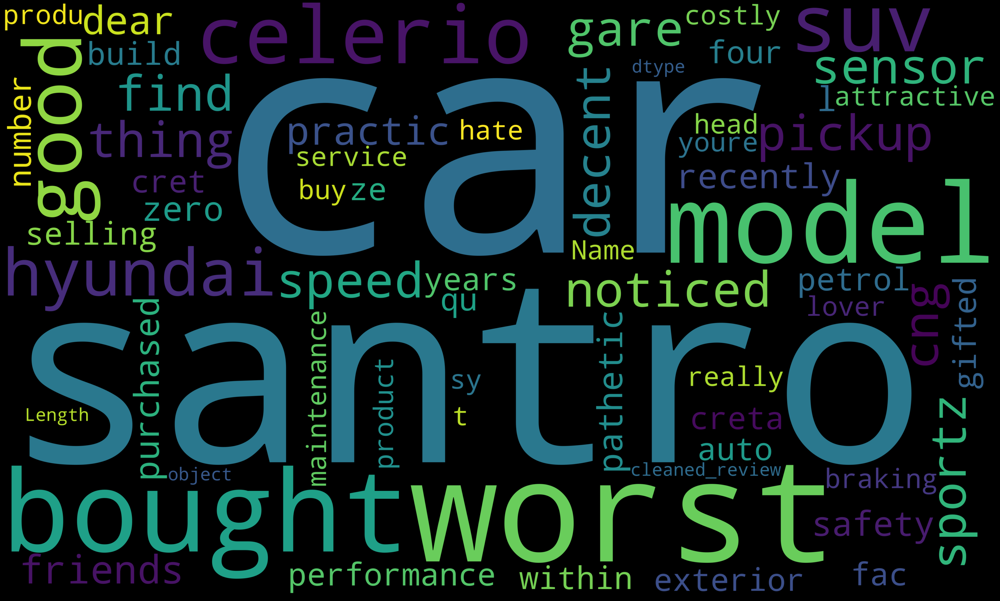

In [77]:
review_p = df.loc[df['brand'] == 'Hyundai Cars'][df.loc[df['brand'] == 'Hyundai Cars']["sentiment_by_rating"] == 0][0:1000]
text = review_p['cleaned_review']

wordcloud = WordCloud(
    width = 5000,
    height = 3000,
    max_words=200,
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

However, the negative opinions are more valuable than the positive for the shareholders and investors of brands. These stakeholders could evaluate the negative reviews to detect the common users’ requirements from the comment sections of different car websites. For example in the word cloud of Hyundai car keywords (as shown in above wordcloud) have some negative words e.g. ‘worst’ indicate the negative comment. Even the more negative views of Hyundai will be alarming for its market value. It was observed that people discuss the other brands as well when they want to talk about any single brand product. It’s concluded that online consumers always try to compare the products of different brands before making a purchase decision. For instance, in word cloud of Hyundai car, people are discussing about other car model like ‘maruti celerio’.

# Sample Output

To clarify the performance of our model, we created a user given input where random comments about cars have been passed through. We have to check whether the model giving correct sentiment class or not on the basis of that review. 

In [79]:
import pickle
test_review = [input("Please enter a review:\n ")]
review_df = pd.DataFrame(test_review,columns = ["review"])
review_df['review']=review_df['review'].apply(lambda x:review_cleaning(x))
review_df['review1']=review_df['review'].apply(lambda x:remove_digits(x))
review_df['cleaned_review']=review_df['review1'].apply(lambda x:strip_emoji(x))
review_df['cleaned_review'] = review_df['cleaned_review'].apply(lambda x: ' '.join([word for word in x.split()
                                                                                    if word not in (stop_words)]))
review_df['tokenized_sents'] = review_df.apply(lambda row: nltk.word_tokenize(row['cleaned_review']), axis=1)
saved_tfidf = pickle.load(open('final_tfidf.pickle','rb'))
eva = saved_tfidf.transform(review_df['tokenized_sents'])
saved_model = pickle.load(open('final_model1.pickle','rb'))
pred=saved_model.predict(eva)[0]

if pred==2:
    pred_sent="Positive"
elif pred==1:
    pred_sent="Neutral" 
else:
    pred_sent="Negative" 
        
new_df=pd.DataFrame({"Text By User":test_review,"Sentiment":pred_sent})
new_df

Please enter a review:
 I recommend not to buy this car, very poor customer service and you will be loser after sales service even. An honest advice.


,Text By User,Sentiment
0,"I recommend not to buy this car, very poor cus...",Negative


# Thank You !!!!! Happy Learning :)